In [ ]:
## import pakage
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno ## 결측치 확인
from fancyimpute import IterativeImputer ## 다중대체
import seaborn.objects as so ## seaborn의 다른 라이브러리
import warnings ## warnings message 표시 안함
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split
%config InlineBackend.figure_format = 'retina' ## 선명하게 만들기

In [ ]:
# read data
data = pd.read_csv("C:\\Users\\서가은\\Desktop\\baf_med\\merged_data.csv")
data.head()

# data 정보 확인
- 결측치 없음, 중복행 없음
- 정상(CN) : 85명, 경증 (MCI) : 47명, 치매(Dem) : 9명

In [ ]:
print(data.info()) ## data 정보 확인
print(data.isna().sum())## 결측치 없음
print('\n',data.describe()) ## 기술 통계량 확인
print('\n',data.columns) ## 중복 행 확인

In [ ]:
# 이메일 주소에서 숫자 부분을 추출하여 'ID' 변수 생성 > 
data['ID'] = data['EMAIL'].str.extract(r'(\d+)')
data.columns
data['sleep_bedtime_start'].count()

In [ ]:
data.groupby('DIAG_NM').count()['EMAIL'].plot(kind='bar', color='blue')
plt.title("count")
plt.xticks(rotation=0)

In [ ]:
plt.pie(data.groupby('DIAG_NM').count()['EMAIL'], 
        labels=data.groupby('DIAG_NM').count()['EMAIL'].index,
        autopct='%1.1f%%', colors=['skyblue', 'lightgreen', 'lightcoral'])

In [ ]:
data.groupby('DIAG_NM').nunique()['EMAIL']

In [ ]:
CN_data=data[data['DIAG_NM']=='CN']
MCI_data=data[data['DIAG_NM']=='MCI']
Dem_data=data[data['DIAG_NM']=='Dem']
CN_data=CN_data.reset_index(drop=True)
MCI_data=MCI_data.reset_index(drop=True)
Dem_data=Dem_data.reset_index(drop=True)

In [ ]:
data.head()

In [ ]:
unique_ID = data['ID'].unique()
print(unique_ID, len(unique_ID)) ## 141개의 ID

In [ ]:
## 환자별 수집 기간이 차이남
print(CN_data['ID'].value_counts(),MCI_data['ID'].value_counts(),Dem_data['ID'].value_counts())

In [ ]:
## 정상의 ID만 추출
CN_ID = CN_data['ID'].unique()

In [ ]:
CN_grouped_data = dict(tuple(CN_data.groupby('ID')))
CN_example_email = CN_ID

# 데이터를 담을 딕셔너리 생성
CN_data_dict = {}

# 각 고유한 이메일에 대해 반복하여 데이터 추출
for email in CN_example_email:
    CN_data_dict[email] = CN_grouped_data[email]

In [ ]:
## 경증 환자의 ID만 추출
MCI_ID = MCI_data['ID'].unique()

In [ ]:
MCI_grouped_data = dict(tuple(MCI_data.groupby('ID')))
MCI_example_email = MCI_ID

# 데이터를 담을 딕셔너리 생성
MCI_data_dict = {}

# 각 고유한 이메일에 대해 반복하여 데이터 추출
for email in MCI_example_email:
    MCI_data_dict[email] = MCI_grouped_data[email]

In [ ]:
MCI_data_dict

In [ ]:
## 치매 환자의 ID만 추출
DEM_ID = Dem_data['ID'].unique()

In [ ]:
Dem_grouped_data = dict(tuple(Dem_data.groupby('ID')))
Dem_example_email = DEM_ID

# 데이터를 담을 딕셔너리 생성
Dem_data_dict = {}

# 각 고유한 이메일에 대해 반복하여 데이터 추출
for email in Dem_example_email:
    Dem_data_dict[email] = Dem_grouped_data[email]


In [ ]:
Dem_data_dict

# 수면 깊이

## 정상 환자들의 수면 깊이 그래프

In [ ]:
# 각 ID에 대해 그래프
for ID, Dem_data in CN_data_dict.items():
    # 새로운 그래프 생성
    plt.figure(figsize=(12, 6))
    
    # 해당 ID의 수면 깊이 데이터 추출
    sleep_depth = Dem_data['sleep_deep']
    
    # 수면 깊이 시계열 그래프 그리기
    plt.plot(sleep_depth)

    plt.title(f'Sleep Depth for ID {ID}')

    plt.ylabel('sleep deep')
    plt.show()



#### 정상 환자들의 수면깊이 그래프 한눈에 보는것인데
- 겹쳐그리기 이렇게 밖에 안나옴 ㅠㅠ (날짜가 달라서 그런듯,,)
- 그리고 이거 보니까 딱히 유사한 패턴 보이지 않음

In [ ]:
plt.figure(figsize=(12, 6))

# 각 ID에 대해 그래프를 그립니다.
for ID, CN_data in CN_data_dict.items():
    # 해당 ID의 수면 깊이 데이터 추출
    sleep_depth = CN_data['sleep_deep']
    
    # 수면 깊이 시계열 그래프 그리기
    plt.plot(sleep_depth, label=f'ID {ID}')

# 그래프 제목 설정
plt.title('Sleep Depth for Each ID')

# x축, y축 라벨 설정
plt.xlabel('Time')
plt.ylabel('Sleep Depth')

# 범례 표시
plt.legend()

# 그래프 출력
plt.show()


## 경증 환자들의 수면 깊이 그래프

In [ ]:
for ID, MCI_data in MCI_data_dict.items():
    # 새로운 그래프 생성
    plt.figure(figsize=(12, 6))
    
    # 해당 ID의 수면 깊이 데이터 추출
    sleep_depth = MCI_data['sleep_deep']
    
    # 수면 깊이 시계열 그래프 그리기
    plt.plot(sleep_depth)
    
    # 그래프 제목 설정
    plt.title(f'Sleep Depth for ID {ID}')
    
    # x축, y축 라벨 설정
 
    plt.ylabel('sleep deep')
    
    # 그래프 출력
    plt.show()

### 경증 환자들의 수면 깊이 그래프 한눈에

In [ ]:
# 새로운 그래프 생성
plt.figure(figsize=(12, 6))

# 각 ID에 대해 그래프를 그립니다.
for ID, MCI_data in MCI_data_dict.items():
    # 해당 ID의 수면 깊이 데이터 추출
    sleep_depth = MCI_data['sleep_deep']
    
    # 수면 깊이 시계열 그래프 그리기
    plt.plot(sleep_depth, label=f'ID {ID}')

# 그래프 제목 설정
plt.title('Sleep Depth for Each ID')

# x축, y축 라벨 설정
plt.xlabel('Time')
plt.ylabel('Sleep Depth')

# 범례 표시
plt.legend()

# 그래프 출력
plt.show()

## 치매 환자 수면 깊이 그래프

In [ ]:
for ID, Dem_data in Dem_data_dict.items():
    # 새로운 그래프 생성
    plt.figure(figsize=(12, 6))
    
    # 해당 ID의 수면 깊이 데이터 추출
    sleep_depth = Dem_data['sleep_deep']
    
    # 수면 깊이 시계열 그래프 그리기
    plt.plot(sleep_depth)
    
    # 그래프 제목 설정
    plt.title(f'Sleep Depth for ID {ID}')
    
    # x축, y축 라벨 설정
 
    plt.ylabel('sleep deep')
    
    # 그래프 출력
    plt.show()

### 치매 환자 수면 깊이 그래프 한꺼번에 출력

In [ ]:
plt.figure(figsize=(12, 6))

# 각 ID에 대해 그래프를 그립니다.
for ID, Dem_data in Dem_data_dict.items():
    # 해당 ID의 수면 깊이 데이터 추출
    sleep_depth = Dem_data['sleep_deep']
    
    # 수면 깊이 시계열 그래프 그리기
    plt.plot(sleep_depth, label=f'ID {ID}')

# 그래프 제목 설정
plt.title('Sleep Depth for Each ID')

# x축, y축 라벨 설정
plt.xlabel('Time')
plt.ylabel('Sleep Depth')

# 범례 표시
plt.legend()

# 그래프 출력
plt.show()

# 수면 효율 sleep_efficiency

## 정상 수면 효율

In [ ]:
# 새로운 그래프 생성
plt.figure(figsize=(12, 6))

# 각 ID에 대해 그래프를 그립니다.
for ID, CN_data in CN_data_dict.items():
    # 해당 ID의 수면 깊이 데이터 추출
    sleep_depth = CN_data['sleep_efficiency']
    
    # 수면 깊이 시계열 그래프 그리기
    plt.plot(sleep_depth, label=f'ID {ID}')

# 그래프 제목 설정
plt.title('sleep_efficiency for Each ID')

# x축, y축 라벨 설정
plt.xlabel('Time')
plt.ylabel('sleep_efficiency')

# 범례 표시
plt.legend()

# 그래프 출력
plt.show()

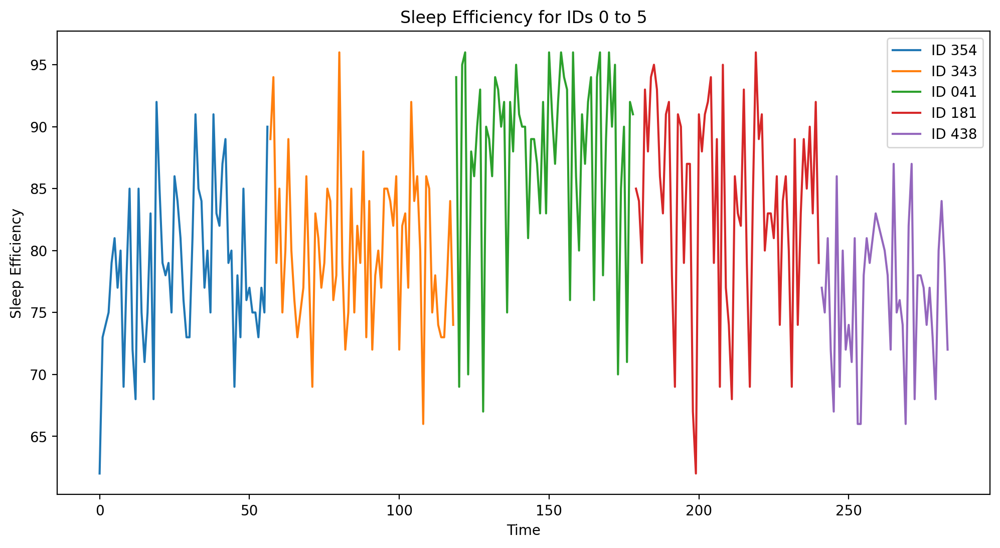

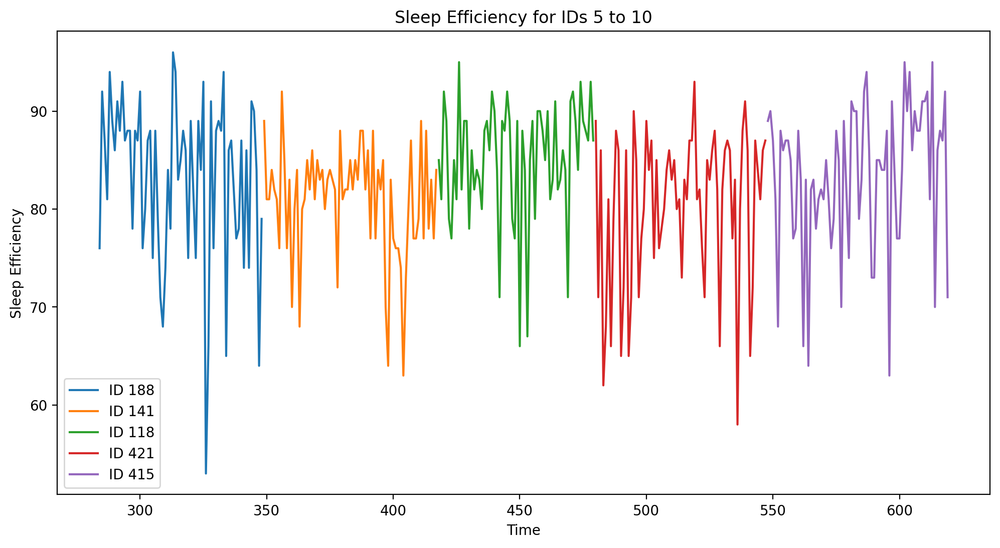

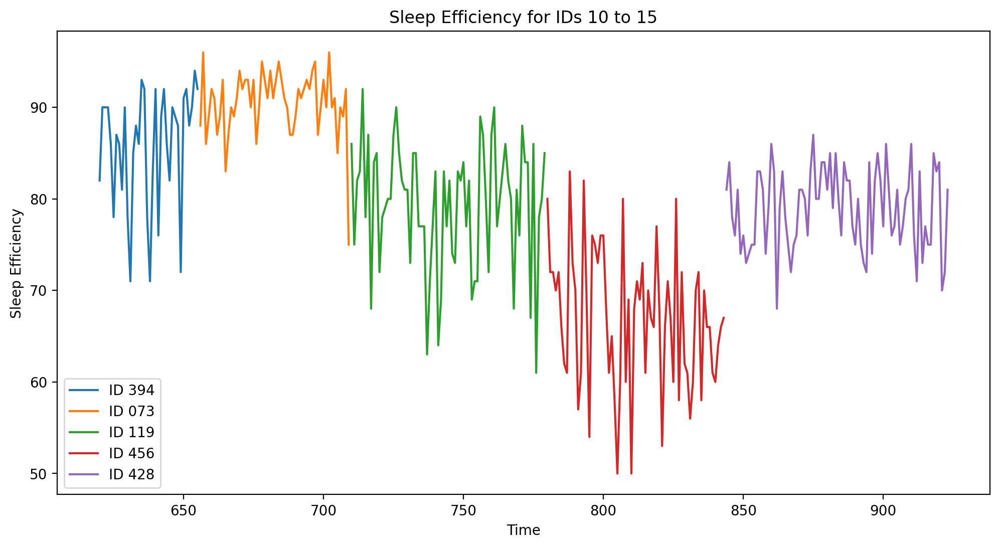

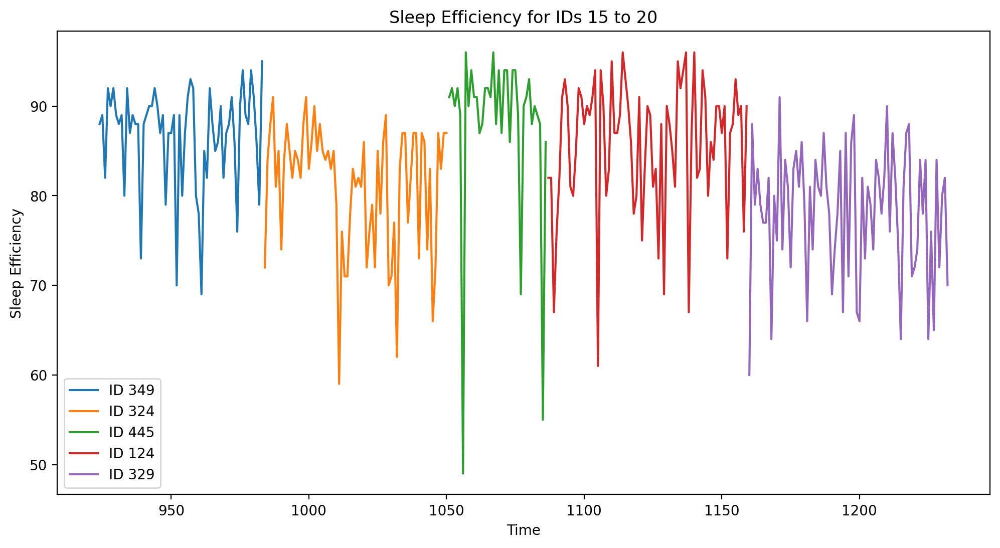

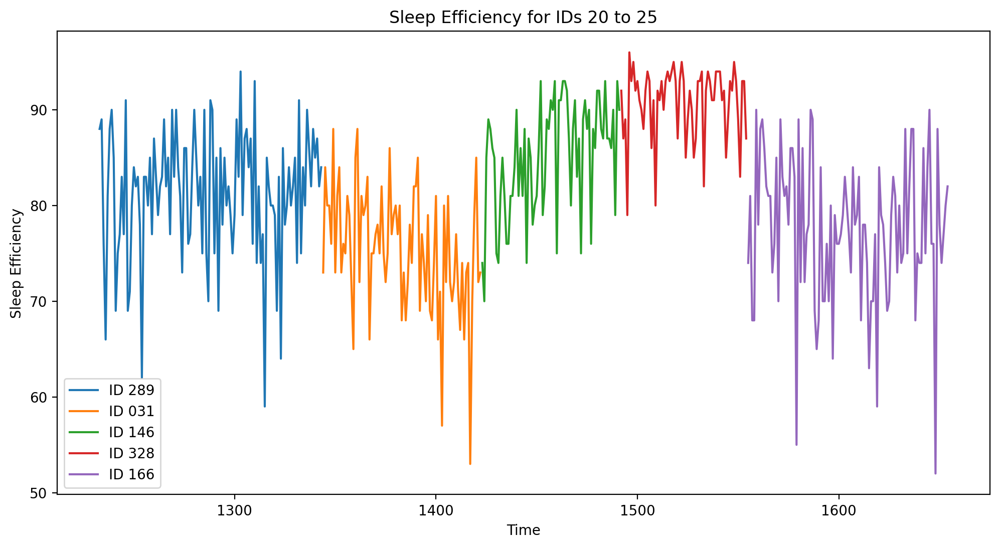

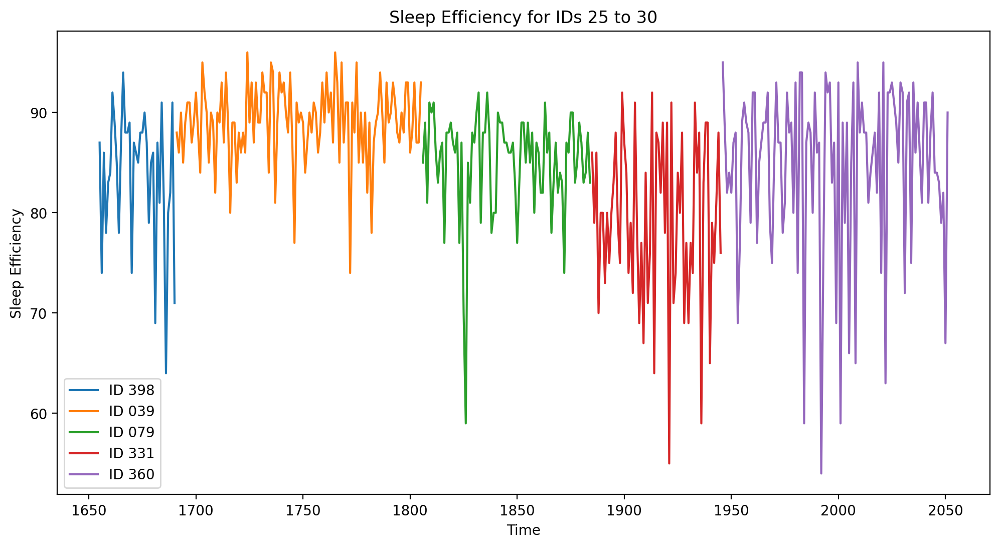

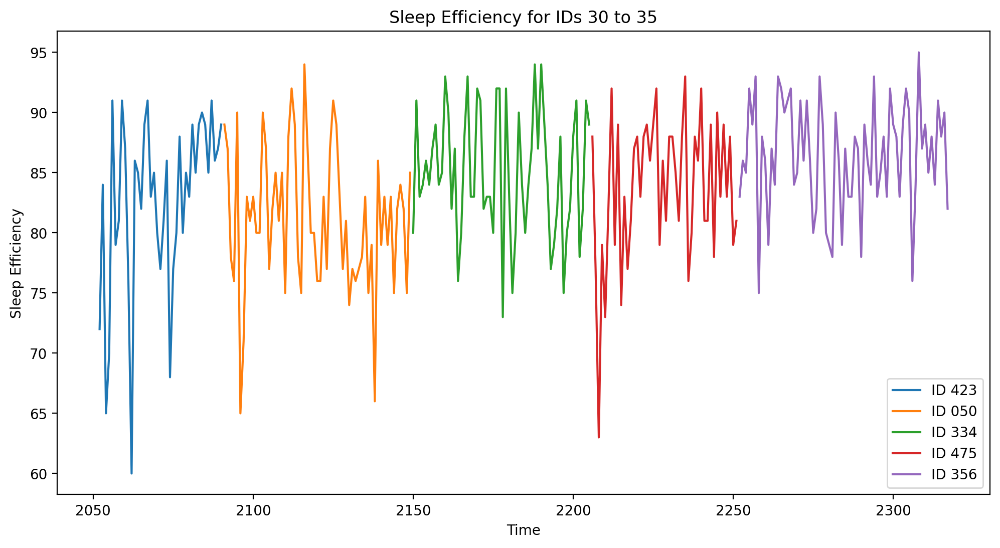

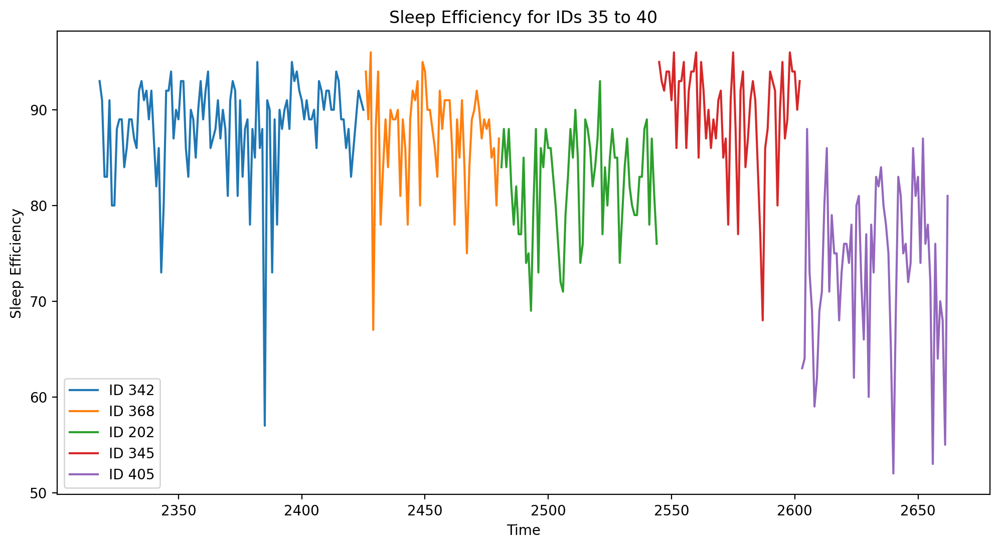

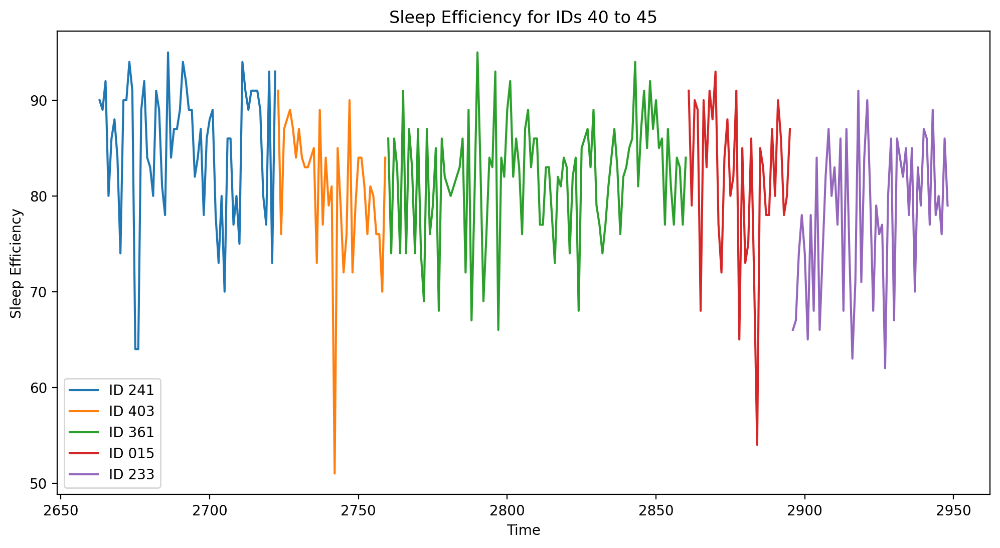

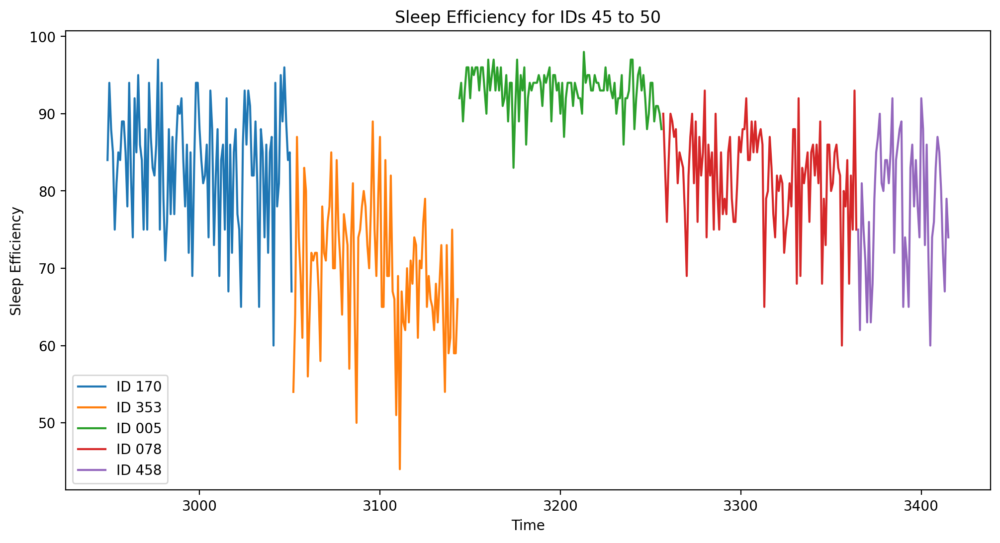

In [184]:
## 이거는 그래프 5개씩 잘라서 보기
# 총 10개의 그래프를 그립니다.
for i in range(10):
    # 새로운 그래프 생성
    plt.figure(figsize=(12, 6))
    # 각 그래프에 대해 10명의 데이터를 한꺼번에 그립니다.
    for j, (ID, MCI_data) in enumerate(CN_data_dict.items()):
        if j >= i * 5 and j < (i + 1) * 5:
            # 해당 ID의 수면 깊이 데이터 추출
            sleep_efficiency = MCI_data['sleep_efficiency']
            plt.plot(sleep_efficiency, label=f'ID {ID}')
    
    # 그래프 제목 설정
    plt.title(f'Sleep Efficiency for IDs {i*5} to {(i+1)*5}')

    # x축, y축 라벨 설정
    plt.xlabel('Time')
    plt.ylabel('Sleep Efficiency')

    # 범례 표시
    plt.legend()

    # 그래프 출력
    plt.show()

## 경증 수면 효율

In [ ]:
# 경증 수면 효율
plt.figure(figsize=(12, 6))

# 각 ID에 대해 그래프를 그립니다.
for ID, MCI_data in MCI_data_dict.items():
    # 해당 ID의 수면 깊이 데이터 추출
    sleep_depth = MCI_data['sleep_efficiency']
    
    # 수면 깊이 시계열 그래프 그리기
    plt.plot(sleep_depth, label=f'ID {ID}')

# 그래프 제목 설정
plt.title('sleep_efficiency for Each ID')

# x축, y축 라벨 설정
plt.xlabel('Time')
plt.ylabel('sleep_efficiency')

# 범례 표시
plt.legend()

# 그래프 출력
plt.show()

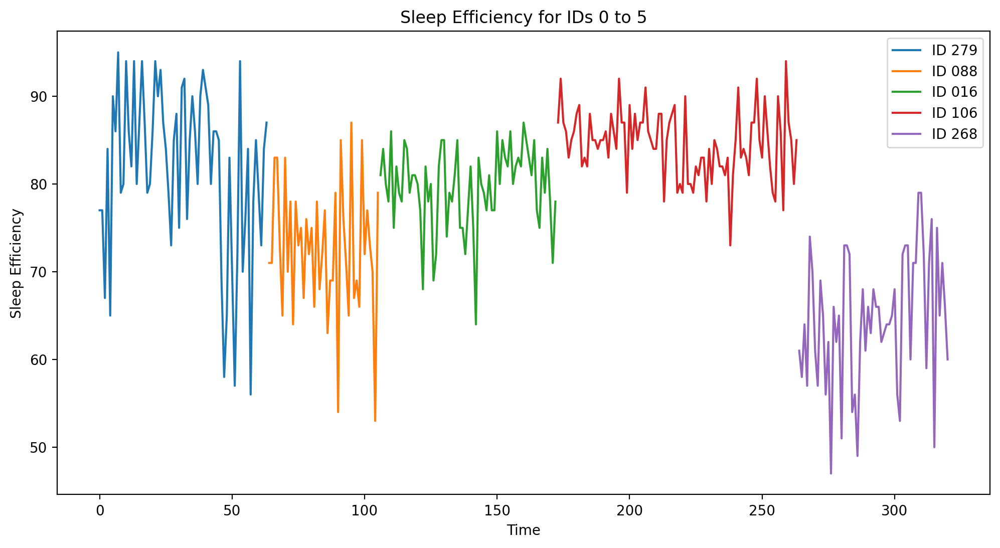

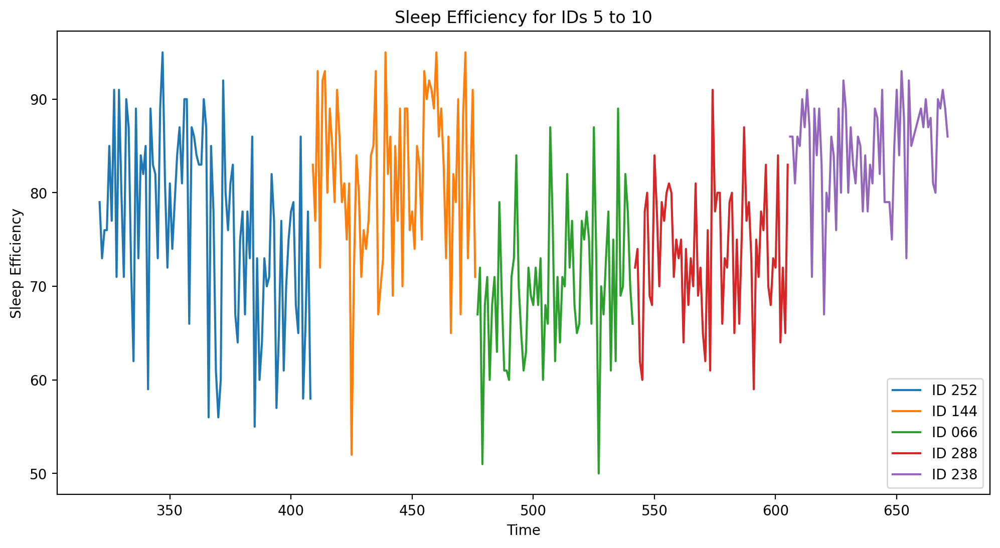

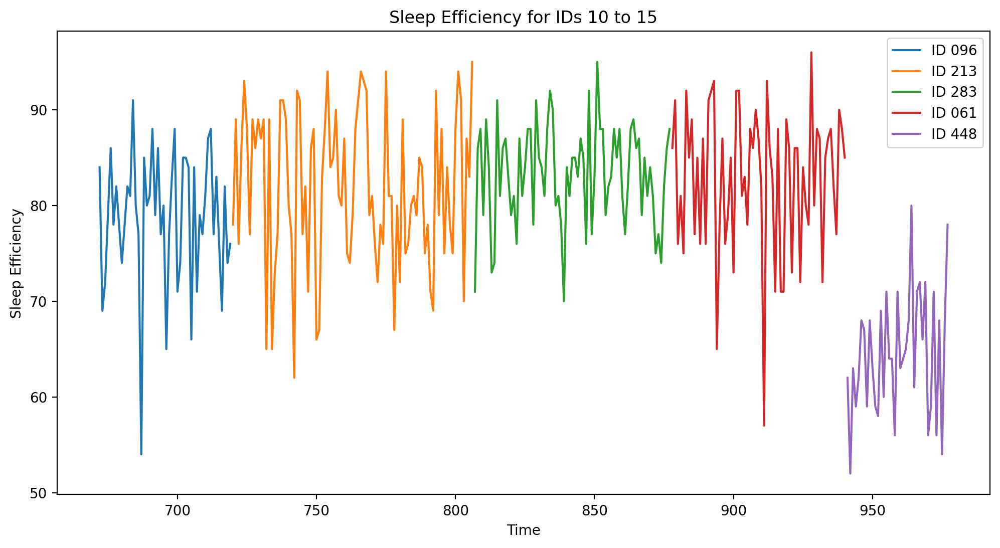

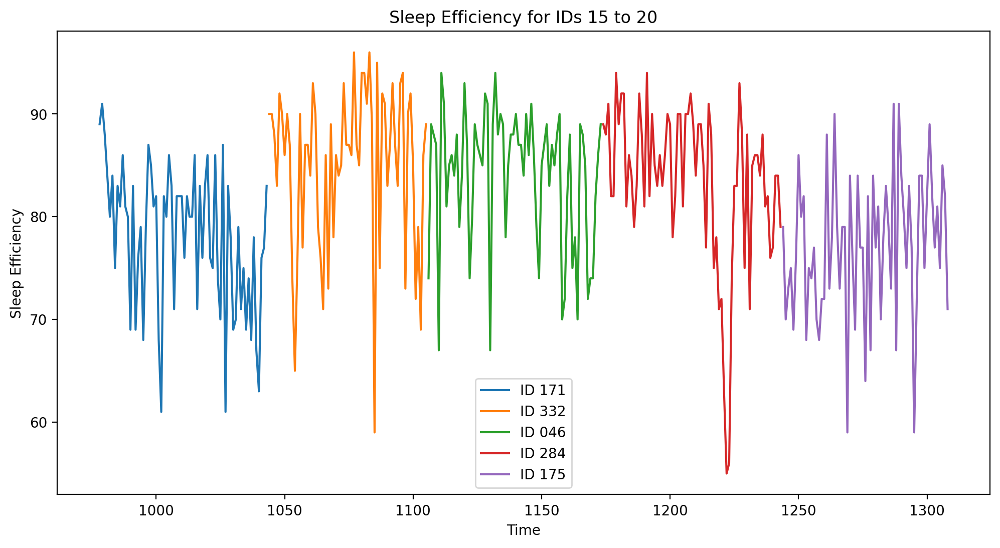

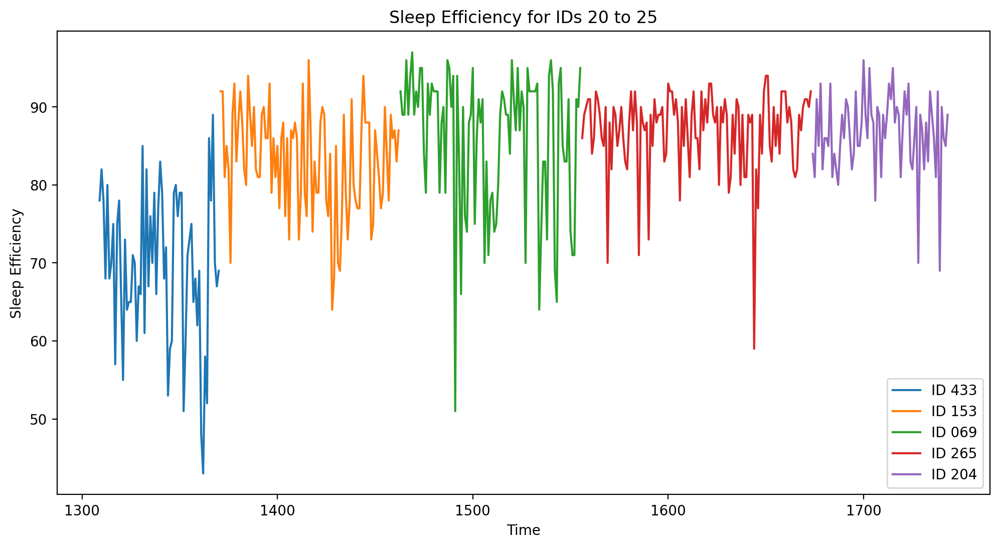

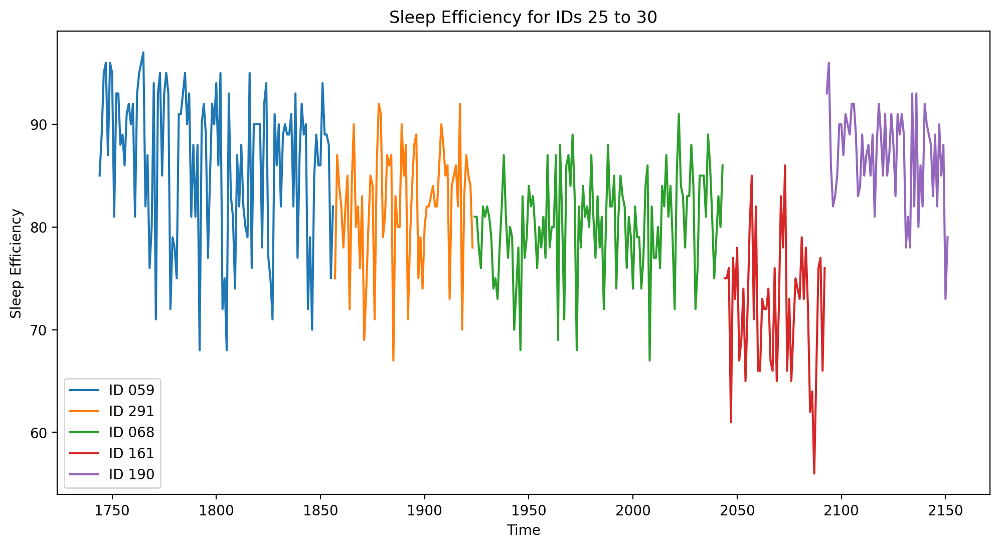

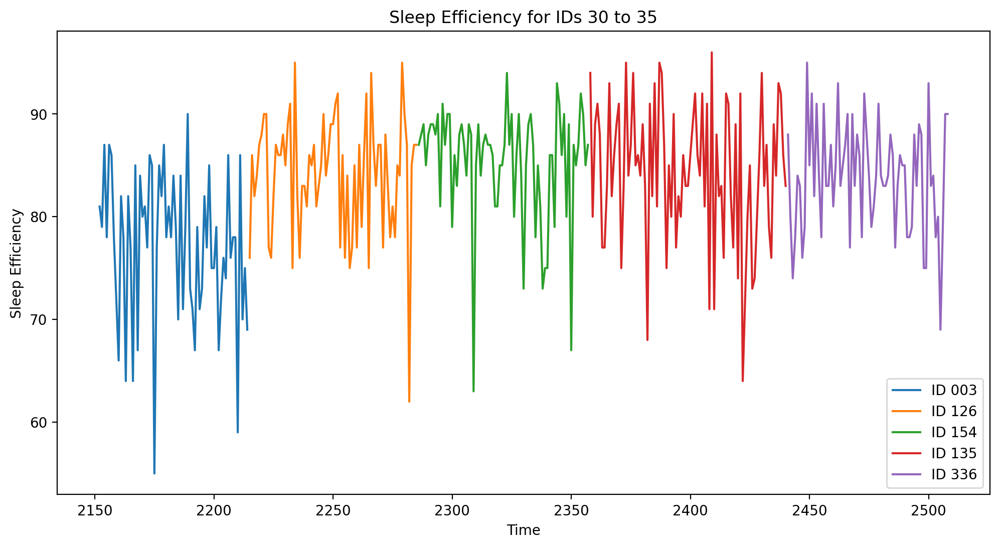

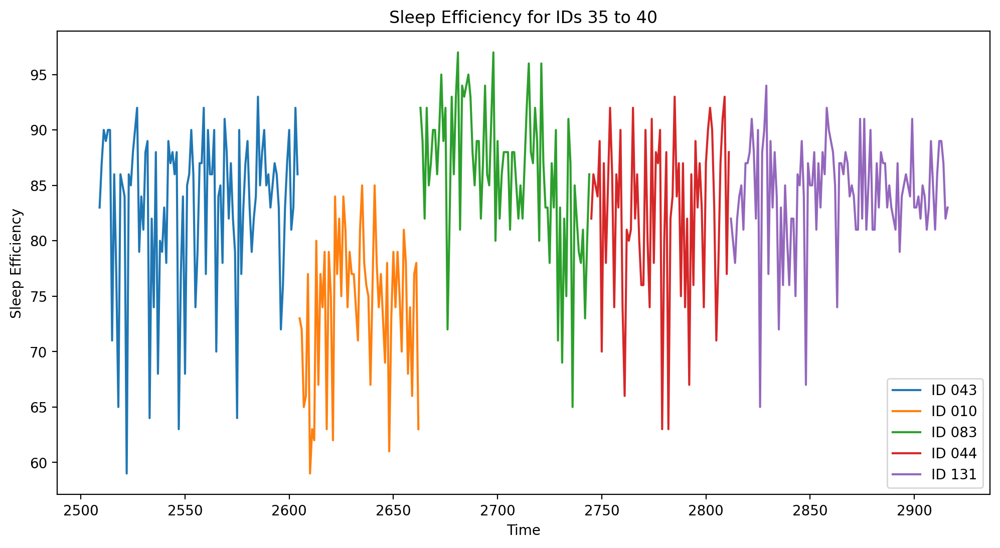

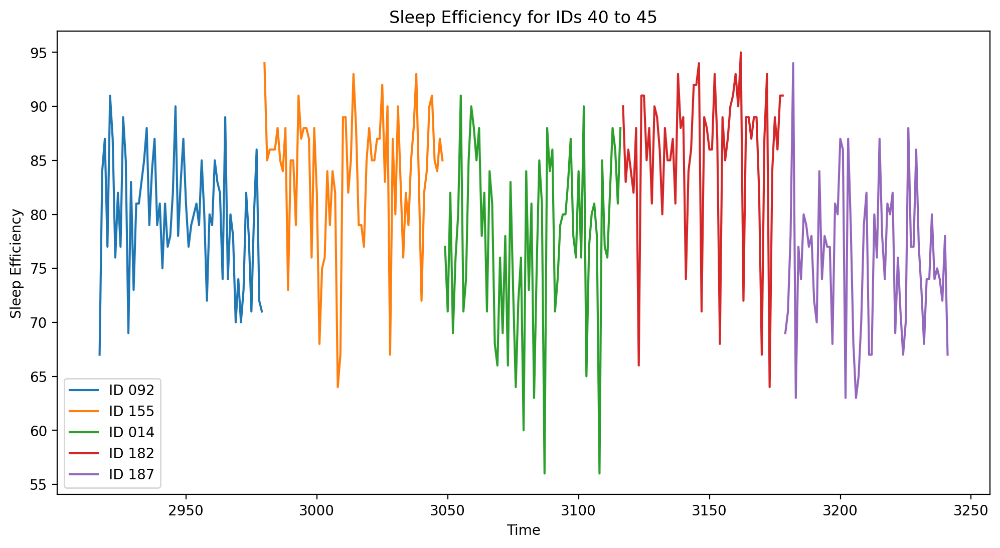

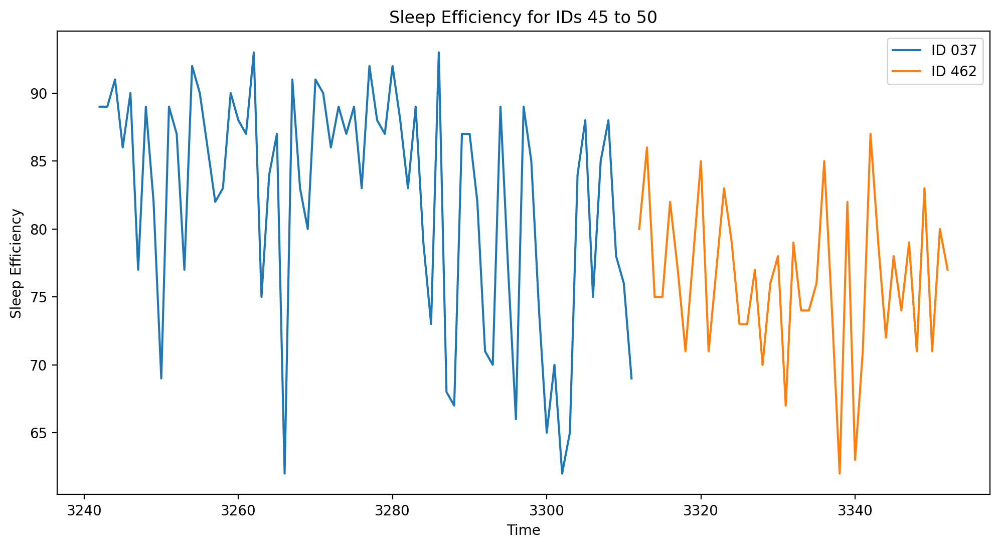

In [185]:
## 이거는 그래프 5개씩 잘라서 보기
# 총 10개의 그래프를 그립니다.
for i in range(10):
    # 새로운 그래프 생성
    plt.figure(figsize=(12, 6))
    # 각 그래프에 대해 10명의 데이터를 한꺼번에 그립니다.
    for j, (ID, MCI_data) in enumerate(MCI_data_dict.items()):
        if j >= i * 5 and j < (i + 1) * 5:
            # 해당 ID의 수면 깊이 데이터 추출
            sleep_efficiency = MCI_data['sleep_efficiency']
            plt.plot(sleep_efficiency, label=f'ID {ID}')
    
    # 그래프 제목 설정
    plt.title(f'Sleep Efficiency for IDs {i*5} to {(i+1)*5}')

    # x축, y축 라벨 설정
    plt.xlabel('Time')
    plt.ylabel('Sleep Efficiency')

    # 범례 표시
    plt.legend()

    # 그래프 출력
    plt.show()

In [ ]:
# 변수의 최댓값과 최솟값을 저장할 딕셔너리 생성
variable_max_values = {}
variable_min_values = {}
variable_deviation = {}
# MCI_data_dict 딕셔너리에서 각 ID에 대한 데이터를 가져와 변수의 최댓값과 최솟값을 계산
for ID, MCI_data in MCI_data_dict.items():
    # 각 변수의 최댓값과 최솟값 계산
    max_values = MCI_data.max()
    min_values = MCI_data.min()
    m_m = max_values - min_values
    # 딕셔너리에 저장
    variable_max_values[ID] = max_values
    variable_min_values[ID] = min_values
    variable_deviation[ID] = max_values - min_values
# 결과 출력
# for ID, m_m in variable_deviation.items():
#     print(f"ID: {ID}")
#     print("최댓값 - 최솟값:")
#     print(m_m)
#     print()
    
for ID, max_values in variable_max_values.items():
    print(f"ID: {ID}")
    print("최댓값:")
    print(max_values)
    print()

for ID, min_values in variable_min_values.items():
    print(f"ID: {ID}")
    print("최솟값:")
    print(min_values)
    print()


## 치매 수면 효율

In [ ]:
## 치매 수면 효율 5개씩
# 총 10개의 그래프를 그립니다.
for i in range(2):
    # 새로운 그래프 생성
    plt.figure(figsize=(12, 6))
    # 각 그래프에 대해 10명의 데이터를 한꺼번에 그립니다.
    for j, (ID, MCI_data) in enumerate(Dem_data_dict.items()):
        if j >= i * 5 and j < (i + 1) * 5:
            # 해당 ID의 수면 깊이 데이터 추출
            sleep_efficiency = MCI_data['sleep_efficiency']
            plt.plot(sleep_efficiency, label=f'ID {ID}')
    
    # 그래프 제목 설정
    plt.title(f'Sleep Efficiency for IDs {i*5} to {(i+1)*5}')

    # x축, y축 라벨 설정
    plt.xlabel('Time')
    plt.ylabel('Sleep Efficiency')

    # 범례 표시
    plt.legend()

    # 그래프 출력
    plt.show()


# 램수면

## 정상 램수면

In [ ]:
for i in range(10):
    plt.figure(figsize=(12, 6))
    for j, (ID, MCI_data) in enumerate(CN_data_dict.items()):
        if j >= i * 5 and j < (i + 1) * 5:
            # 해당 ID의 수면 깊이 데이터 추출
            sleep_efficiency = MCI_data['sleep_rem']
            plt.plot(sleep_efficiency, label=f'ID {ID}')
    plt.title(f'Sleep Rem for IDs {i*5} to {(i+1)*5}')
    plt.xlabel('Time')
    plt.ylabel('Sleep Rem')

    plt.legend()
    plt.show()

## 경증 램수면

In [ ]:
for i in range(10):
    plt.figure(figsize=(12, 6))
    for j, (ID, MCI_data) in enumerate(MCI_data_dict.items()):
        if j >= i * 5 and j < (i + 1) * 5:
            # 해당 ID의 수면 깊이 데이터 추출
            sleep_efficiency = MCI_data['sleep_rem']
            plt.plot(sleep_efficiency, label=f'ID {ID}')

    plt.title(f'Sleep Rem for IDs {i*5} to {(i+1)*5}')
    plt.xlabel('Time')
    plt.ylabel('Sleep Rem')

    plt.legend()
    plt.show()

## 치매 램수면

In [ ]:
for i in range(2):
    plt.figure(figsize=(12, 6))
    for j, (ID, MCI_data) in enumerate(Dem_data_dict.items()):
        if j >= i * 5 and j < (i + 1) * 5:
            # 해당 ID의 수면 깊이 데이터 추출
            sleep_efficiency = MCI_data['sleep_rem']
            plt.plot(sleep_efficiency, label=f'ID {ID}')
    plt.title(f'Sleep Rem for IDs {i*5} to {(i+1)*5}')
    plt.xlabel('Time')
    plt.ylabel('Sleep Rem')

    plt.legend()
    plt.show()

## 날짜 확인

In [203]:
# "ID"기준으로 각 아이디별로 행의 개수를 세기
row_id = data['ID'].value_counts()

# 결과 출력
print(row_id)


ID
068    120
265    118
039    115
059    113
005    113
      ... 
403     37
394     36
445     36
398     36
015     35
Name: count, Length: 141, dtype: int64


# 증상별 상관관계

In [195]:
MCI_data['activity_day_start'].unique()

array(['2020-12-01T04:00:00+09:00', '2020-12-02T04:00:00+09:00',
       '2020-12-03T04:00:00+09:00', '2020-12-04T04:00:00+09:00',
       '2020-12-05T04:00:00+09:00', '2020-12-06T04:00:00+09:00',
       '2020-12-07T04:00:00+09:00', '2020-12-08T04:00:00+09:00',
       '2020-12-09T04:00:00+09:00', '2020-12-10T04:00:00+09:00',
       '2020-12-11T04:00:00+09:00', '2020-12-12T04:00:00+09:00',
       '2020-12-13T04:00:00+09:00', '2020-12-14T04:00:00+09:00',
       '2020-12-15T04:00:00+09:00', '2020-12-16T04:00:00+09:00',
       '2020-12-17T04:00:00+09:00', '2020-12-18T04:00:00+09:00',
       '2020-12-19T04:00:00+09:00', '2020-12-20T04:00:00+09:00',
       '2020-12-21T04:00:00+09:00', '2020-12-23T04:00:00+09:00',
       '2020-12-24T04:00:00+09:00', '2020-12-25T04:00:00+09:00',
       '2020-12-26T04:00:00+09:00', '2020-12-27T04:00:00+09:00',
       '2020-12-28T04:00:00+09:00', '2020-12-29T04:00:00+09:00',
       '2020-12-30T04:00:00+09:00', '2020-12-31T04:00:00+09:00',
       '2021-01-01T04:00:

In [196]:
CN_data['activity_day_start'].unique()

array(['2020-10-19T04:00:00+09:00', '2020-10-20T04:00:00+09:00',
       '2020-10-21T04:00:00+09:00', '2020-10-22T04:00:00+09:00',
       '2020-10-23T04:00:00+09:00', '2020-10-24T04:00:00+09:00',
       '2020-10-25T04:00:00+09:00', '2020-10-26T04:00:00+09:00',
       '2020-10-27T04:00:00+09:00', '2020-10-28T04:00:00+09:00',
       '2020-10-29T04:00:00+09:00', '2020-10-30T04:00:00+09:00',
       '2020-10-31T04:00:00+09:00', '2020-11-01T04:00:00+09:00',
       '2020-11-02T04:00:00+09:00', '2020-11-03T04:00:00+09:00',
       '2020-11-04T04:00:00+09:00', '2020-11-05T04:00:00+09:00',
       '2020-11-06T04:00:00+09:00', '2020-11-07T04:00:00+09:00',
       '2020-11-08T04:00:00+09:00', '2020-11-09T04:00:00+09:00',
       '2020-11-10T04:00:00+09:00', '2020-11-11T04:00:00+09:00',
       '2020-11-12T04:00:00+09:00', '2020-11-13T04:00:00+09:00',
       '2020-11-14T04:00:00+09:00', '2020-11-15T04:00:00+09:00',
       '2020-11-16T04:00:00+09:00', '2020-11-17T04:00:00+09:00',
       '2020-11-18T04:00:

In [192]:
MCI_data.columns

Index(['Unnamed: 0', 'EMAIL', 'activity_average_met', 'activity_cal_active',
       'activity_cal_total', 'activity_daily_movement', 'activity_day_end',
       'activity_day_start', 'activity_high', 'activity_inactive',
       'activity_inactivity_alerts', 'activity_low', 'activity_medium',
       'activity_met_min_high', 'activity_met_min_inactive',
       'activity_met_min_low', 'activity_met_min_medium', 'activity_non_wear',
       'activity_rest', 'activity_score', 'activity_score_meet_daily_targets',
       'activity_score_move_every_hour', 'activity_score_recovery_time',
       'activity_score_stay_active', 'activity_score_training_frequency',
       'activity_score_training_volume', 'activity_steps', 'activity_total',
       'CONVERT(activity_class_5min USING utf8)',
       'CONVERT(activity_met_1min USING utf8)', 'sleep_awake',
       'sleep_bedtime_end', 'sleep_bedtime_start', 'sleep_breath_average',
       'sleep_deep', 'sleep_duration', 'sleep_efficiency', 'sleep_hr_average'

In [197]:
## score, convert 제외한 활동
MCI_data_act = MCI_data[['ID','activity_average_met', 'activity_cal_active',
       'activity_cal_total', 'activity_daily_movement', 'activity_day_end',
       'activity_day_start', 'activity_high', 'activity_inactive',
       'activity_inactivity_alerts', 'activity_low', 'activity_medium',
       'activity_met_min_high', 'activity_met_min_inactive',
       'activity_met_min_low', 'activity_met_min_medium', 'activity_non_wear',
       'activity_rest','activity_steps', 'activity_total']]

In [193]:
MCI_data_sleep = MCI_data[['ID','sleep_awake',
       'sleep_bedtime_end', 'sleep_bedtime_start', 'sleep_breath_average',
       'sleep_deep', 'sleep_duration', 'sleep_efficiency', 'sleep_hr_average',
       'sleep_hr_lowest', 'sleep_is_longest', 'sleep_light',
       'sleep_midpoint_at_delta', 'sleep_midpoint_time', 'sleep_onset_latency',
       'sleep_period_id', 'sleep_rem', 'sleep_restless', 'sleep_rmssd',
       'sleep_temperature_delta', 'sleep_temperature_deviation', 'sleep_total']]

In [198]:
CN_data_act = CN_data[['ID','activity_average_met', 'activity_cal_active',
       'activity_cal_total', 'activity_daily_movement', 'activity_day_end',
       'activity_day_start', 'activity_high', 'activity_inactive',
       'activity_inactivity_alerts', 'activity_low', 'activity_medium',
       'activity_met_min_high', 'activity_met_min_inactive',
       'activity_met_min_low', 'activity_met_min_medium', 'activity_non_wear',
       'activity_rest','activity_steps', 'activity_total']]

In [199]:
CN_data_sleep = CN_data[['ID','sleep_awake',
       'sleep_bedtime_end', 'sleep_bedtime_start', 'sleep_breath_average',
       'sleep_deep', 'sleep_duration', 'sleep_efficiency', 'sleep_hr_average',
       'sleep_hr_lowest', 'sleep_is_longest', 'sleep_light',
       'sleep_midpoint_at_delta', 'sleep_midpoint_time', 'sleep_onset_latency',
       'sleep_period_id', 'sleep_rem', 'sleep_restless', 'sleep_rmssd',
       'sleep_temperature_delta', 'sleep_temperature_deviation', 'sleep_total']]

## 활동

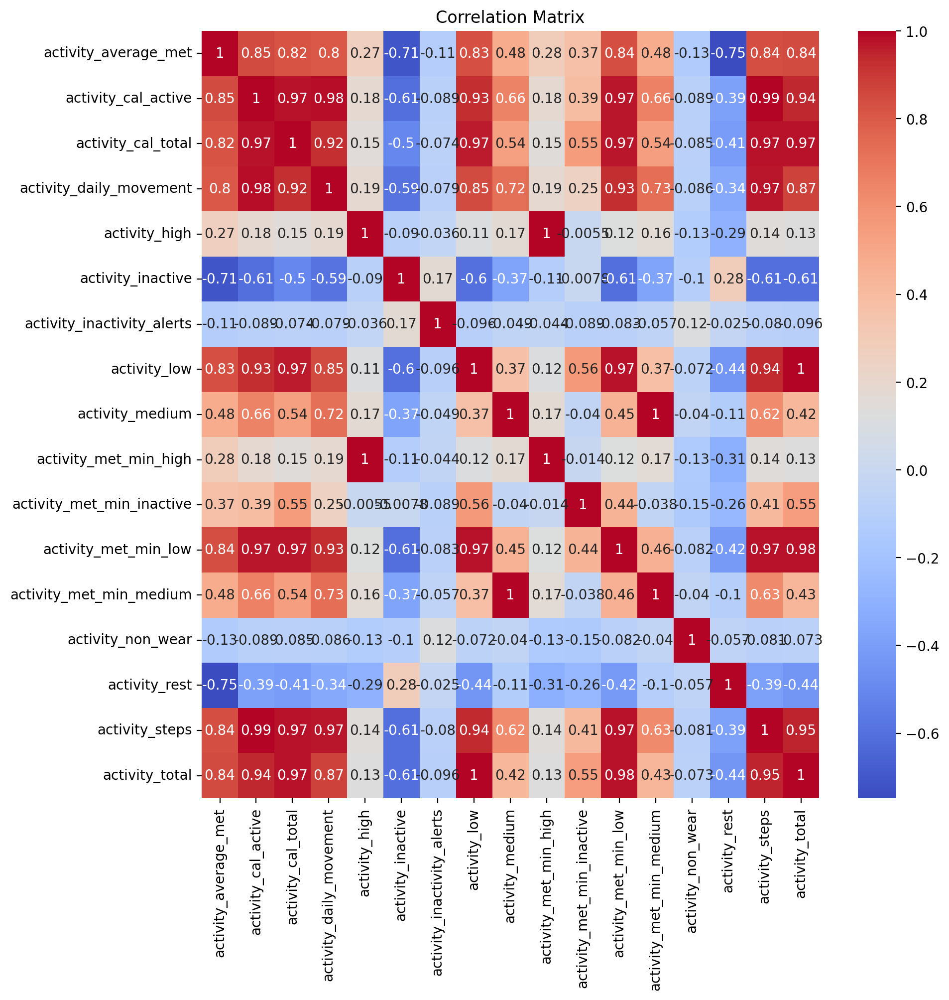

In [186]:
# 숫자형 열만 선택하여 상관 행렬 계산
numeric_columns = MCI_data_act.select_dtypes(include=['float64', 'int64'])
correlation_matrix_MCI_data_act = numeric_columns.corr()

# 상관 행렬 시각화
plt.figure(figsize=(10, 10))
sns.heatmap(correlation_matrix_MCI_data_act, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()



In [ ]:
# ## 이거는 절댓값이 0.5이상인 행렬들만 보는 것
# # 숫자형 열만 선택하여 상관 행렬 계산
# numeric_columns = MCI_data_sleep.select_dtypes(include=['float64', 'int64'])
# correlation_matrix = numeric_columns.corr()

# # 0.5 이상인 상관관계 필터링
# high_corr_matrix = correlation_matrix[abs(correlation_matrix) >= 0.5]

# # 상관 행렬 시각화
# plt.figure(figsize=(10, 10))
# sns.heatmap(high_corr_matrix, annot=True, cmap='coolwarm')
# plt.title('High Correlation Matrix (|corr| >= 0.5)')
# plt.show()


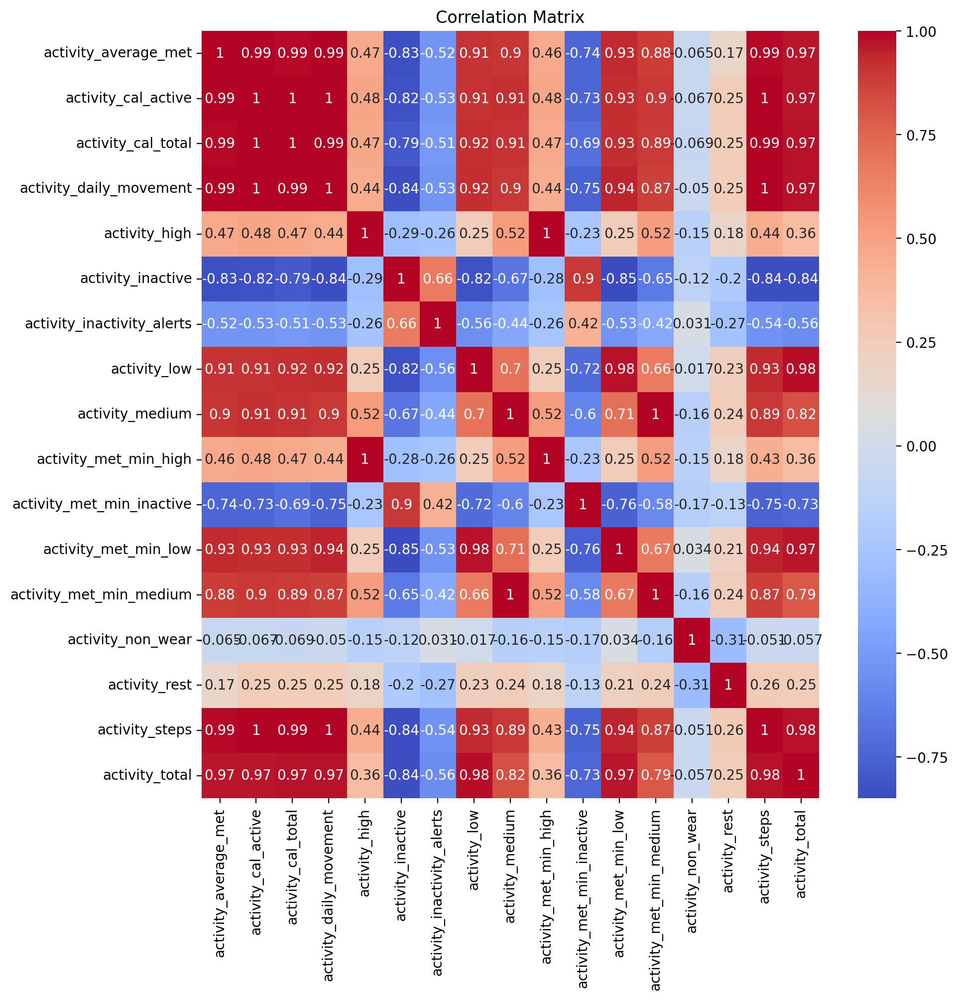

In [187]:
# 숫자형 열만 선택하여 상관 행렬 계산
numeric_columns = CN_data_act.select_dtypes(include=['float64', 'int64'])
correlation_matrix_CN_data_act = numeric_columns.corr()

# 상관 행렬 시각화
plt.figure(figsize=(10, 10))
sns.heatmap(correlation_matrix_CN_data_act, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

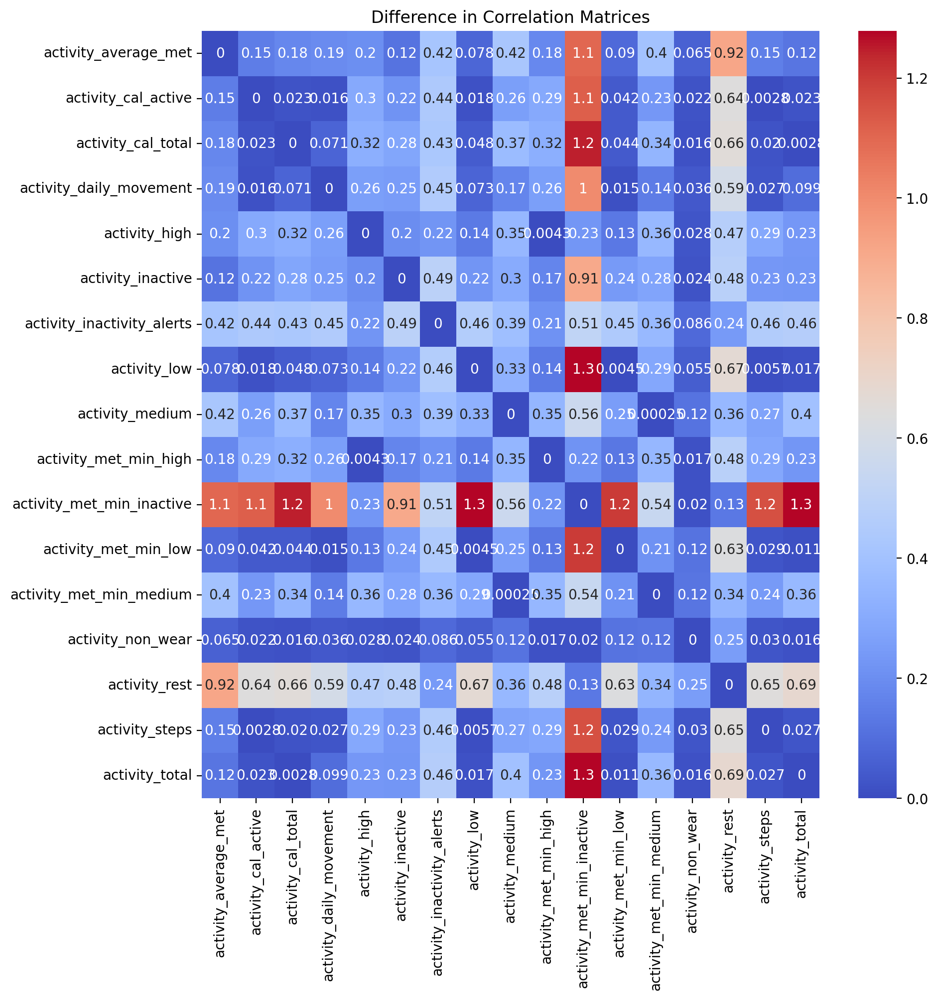

In [188]:
## 정상 활동 - 경증 활동
# 두 상관 행렬 간의 차이 계산
correlation_matrix_diff = abs(correlation_matrix_CN_data_act - correlation_matrix_MCI_data_act)

# 차이가 많이 나는 부분 시각화
plt.figure(figsize=(10, 10))
sns.heatmap(correlation_matrix_diff, annot=True, cmap='coolwarm')
plt.title('Difference in Correlation Matrices')
plt.show()


## 수면

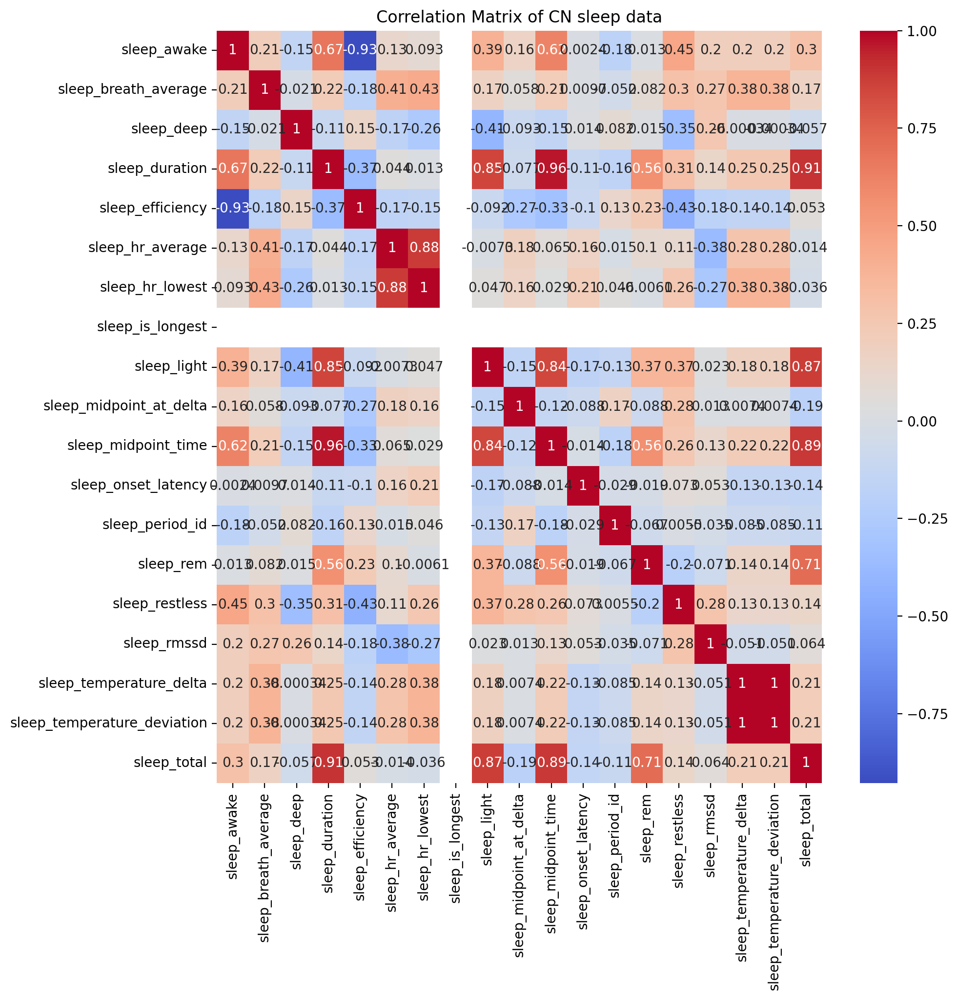

In [189]:
# 숫자형 열만 선택하여 상관 행렬 계산
numeric_columns_cn_sleep = CN_data_sleep.select_dtypes(include=['float64', 'int64'])
correlation_matrix_CN_data_sleep = numeric_columns_cn_sleep.corr()

# 상관 행렬 시각화
plt.figure(figsize=(10, 10))
sns.heatmap(correlation_matrix_CN_data_sleep, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of CN sleep data')
plt.show()

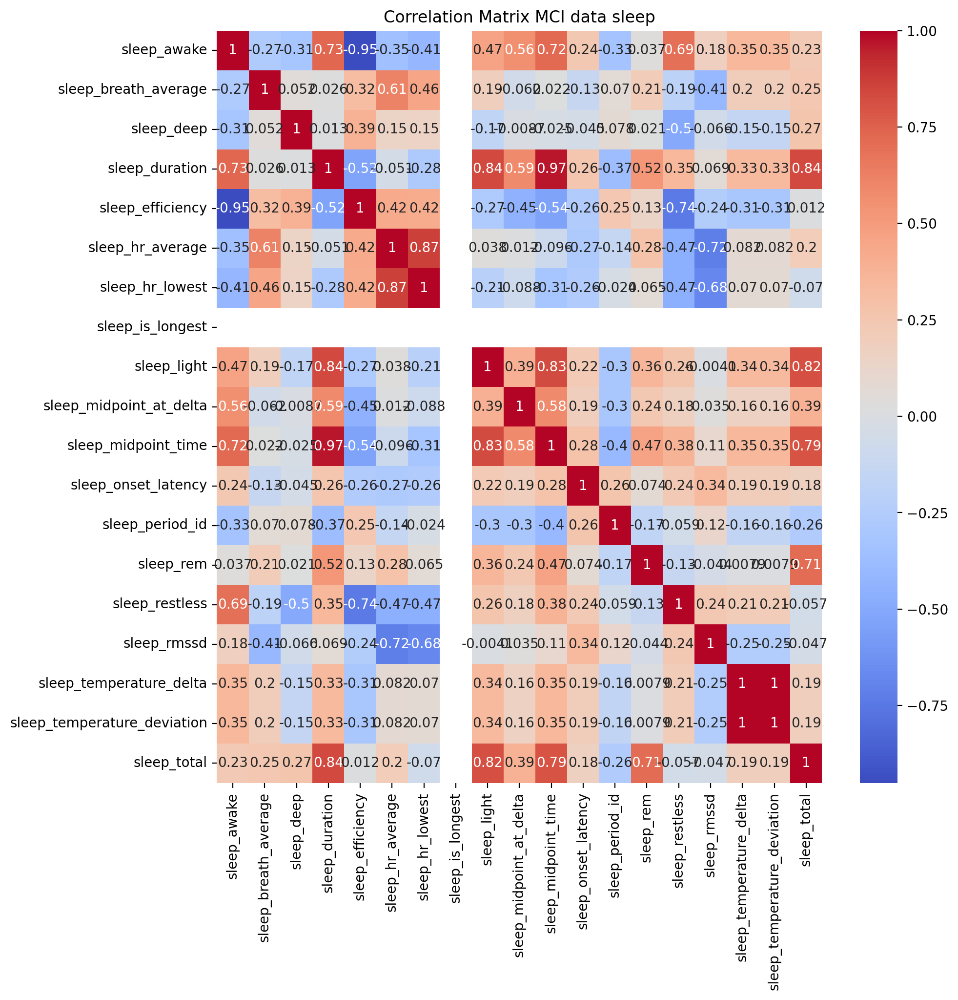

In [190]:
# 숫자형 열만 선택하여 상관 행렬 계산
numeric_columns_mci_sleep = MCI_data_sleep.select_dtypes(include=['float64', 'int64'])
correlation_matrix_MCI_data_sleep = numeric_columns_mci_sleep.corr()

# 상관 행렬 시각화
plt.figure(figsize=(10, 10))
sns.heatmap(correlation_matrix_MCI_data_sleep, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix MCI data sleep')
plt.show()

In [ ]:
# ## 두 상관 행렬 차이 - 유클리드 거리'
# correlation_matrix_diff = (correlation_matrix_CN_data_sleep - correlation_matrix_MCI_data_sleep)
# euclidean_distance = np.linalg.norm(correlation_matrix_diff)
# print(euclidean_distance)

In [ ]:
# # 두 데이터프레임에서 동일한 변수 선택
# common_columns = list(set(MCI_data_sleep.columns) & set(CN_data_sleep.columns))

# # 동일한 변수만 선택하여 상관 행렬 계산
# correlation_matrix_CN_data_sleep_common = CN_data_sleep[common_columns].corr()
# correlation_matrix_MCI_data_sleep_common = MCI_data_sleep[common_columns].corr()

# # 두 상관 행렬 간의 차이 계산
# correlation_matrix_diff_common = correlation_matrix_CN_data_sleep_common - correlation_matrix_MCI_data_sleep_common
# euclidean_distance_common = np.linalg.norm(correlation_matrix_diff_common)
# print("유클리드 거리:", euclidean_distance_common)


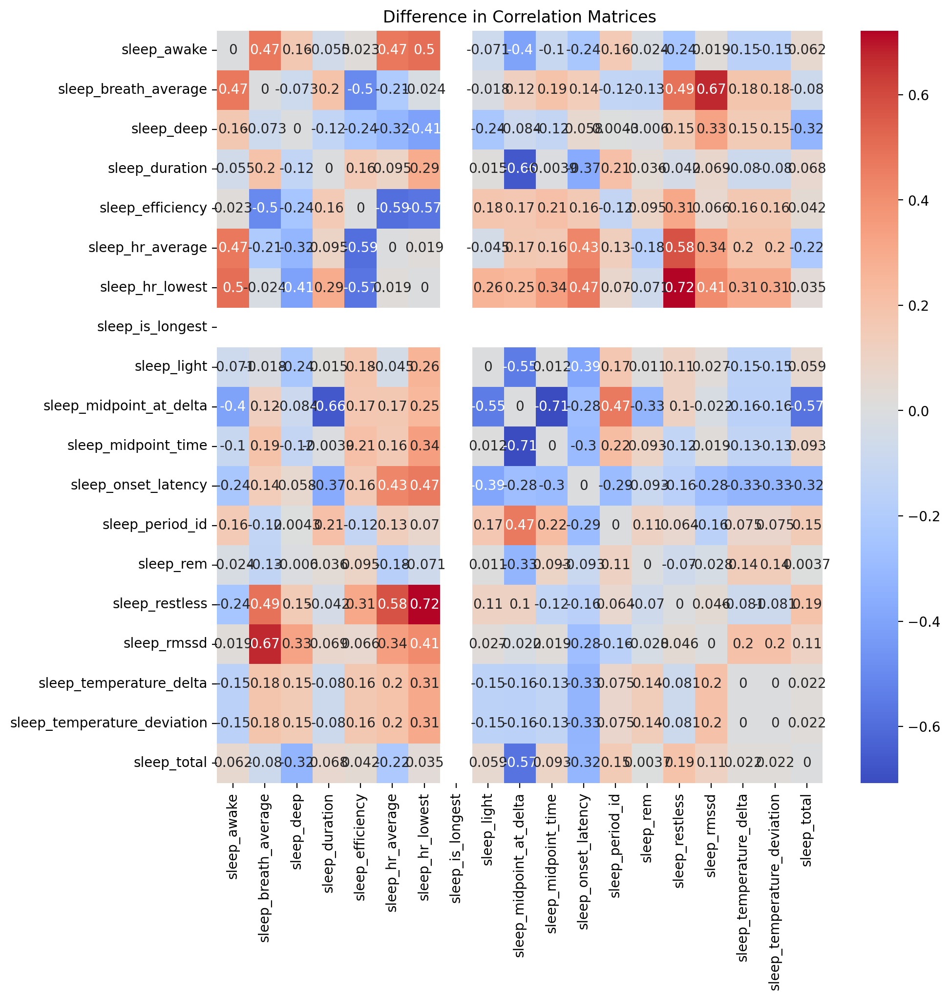

In [191]:
## 정상 수면 - 경증 수면
# 두 상관 행렬 간의 차이 계산
correlation_matrix_diff = (correlation_matrix_CN_data_sleep - correlation_matrix_MCI_data_sleep)

# 차이가 많이 나는 부분 시각화
plt.figure(figsize=(10, 10))
sns.heatmap(correlation_matrix_diff, annot=True, cmap='coolwarm')
plt.title('Difference in Correlation Matrices')
plt.show()
